In [41]:
import re  
import pickle
import nltk 
import string 
import warnings
import numpy as np
import pandas as pd
from nltk.stem import WordNetLemmatizer
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [2]:
warnings.filterwarnings("ignore")
pd.set_option("display.max_colwidth", 200)

In [3]:
t_data = pd.read_csv("../data/final_dataset/Training_Data.csv")
## v_data = pd.read_csv("../data/final_dataset/Validation_Data.csv")

In [4]:
t_data.head()

,Tweet,Target
0,i was severely depressed during the summer of 2017* that i seriously thought what i have isnt depression anymore it surpassed it that iâm the first holder of a new worse mental illness,1
1,"What it's like to be me: I wake up in a panic knowing all the things that have to get done today, already dreading the moment my feet touch the ground. #MentalHealthIssues #Anxienty #Depression",1
2,"@aquariusguts bpd, anxiety and depression ð»",1
3,Depression makes you forget you were trying to not gain weight,1
4,can we really survive depression???? https://twitter.com/depressionarmy/status/1045015996321476608Â â¦,1


In [ ]:
## v_data.head()

In [5]:
text, sentiment = list(t_data["Tweet"]), list(t_data["Target"])

In [6]:
## Defining dictionary containing all emojis with their meanings.
emojis = {':)': 'smile', ':-)': 'smile', ';d': 'wink', ':-E': 'vampire', ':(': 'sad', 
          ':-(': 'sad', ':-<': 'sad', ':P': 'raspberry', ':O': 'surprised',
          ':-@': 'shocked', ':@': 'shocked',':-$': 'confused', ':\\': 'annoyed', 
          ':#': 'mute', ':X': 'mute', ':^)': 'smile', ':-&': 'confused', '$_$': 'greedy',
          '@@': 'eyeroll', ':-!': 'confused', ':-D': 'smile', ':-0': 'yell', 'O.o': 'confused',
          '<(-_-)>': 'robot', 'd[-_-]b': 'dj', ":'-)": 'sadsmile', ';)': 'wink', 
          ';-)': 'wink', 'O:-)': 'angel','O*-)': 'angel','(:-D': 'gossip', '=^.^=': 'cat'}

## Defining set containing all stopwords in english.
stopwordlist = ['a', 'about', 'above', 'after', 'again', 'ain', 'all', 'am', 'an',
             'and','any','are', 'as', 'at', 'be', 'because', 'been', 'before',
             'being', 'below', 'between','both', 'by', 'can', 'd', 'did', 'do',
             'does', 'doing', 'down', 'during', 'each','few', 'for', 'from', 
             'further', 'had', 'has', 'have', 'having', 'he', 'her', 'here',
             'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in',
             'into','is', 'it', 'its', 'itself', 'just', 'll', 'm', 'ma',
             'me', 'more', 'most','my', 'myself', 'now', 'o', 'of', 'on', 'once',
             'only', 'or', 'other', 'our', 'ours','ourselves', 'out', 'own', 're',
             's', 'same', 'she', "shes", 'should', "shouldve",'so', 'some', 'such',
             't', 'than', 'that', "thatll", 'the', 'their', 'theirs', 'them',
             'themselves', 'then', 'there', 'these', 'they', 'this', 'those', 
             'through', 'to', 'too','under', 'until', 'up', 've', 'very', 'was',
             'we', 'were', 'what', 'when', 'where','which','while', 'who', 'whom',
             'why', 'will', 'with', 'won', 'y', 'you', "youd","youll", "youre",
             "youve", 'your', 'yours', 'yourself', 'yourselves']

In [29]:
def elongate_words(tweet):
    tweet = re.sub(r"he's | hes", "he is ", tweet)
    tweet = re.sub(r"there's | theres", "there is ", tweet)
    tweet = re.sub(r"we're", "we are ", tweet)
    tweet = re.sub(r"thats", "that is ", tweet)
    tweet = re.sub(r"won't | wont", "will not ", tweet)
    tweet = re.sub(r"they're | theyre", "they are ", tweet)
    tweet = re.sub(r"can't | cant", "cannot ", tweet)
    tweet = re.sub(r"wasn't | wasnt", "was not ", tweet)
    tweet = re.sub(r"don't | dont", "do not ", tweet)
    tweet = re.sub(r"aren't | arent", "are not ", tweet)
    tweet = re.sub(r"isn't | isnt", "is not ", tweet)
    tweet = re.sub(r"what's | whats", "what is ", tweet)
    tweet = re.sub(r"haven't | havent", "have not ", tweet)
    tweet = re.sub(r"hasn't | hasnt", "has not ", tweet)
    tweet = re.sub(r"there's | theres", "there is ", tweet)
    tweet = re.sub(r"it's | its", "it is ", tweet)
    tweet = re.sub(r"you're | youre", "you are ", tweet)
    tweet = re.sub(r"i'm | im", "i am ", tweet)
    tweet = re.sub(r"shouldn't | shouldnt", "should not ", tweet)
    tweet = re.sub(r"wouldn't | wouldnt", "would not ", tweet)
    tweet = re.sub(r"here's | heres", "here is ", tweet)
    tweet = re.sub(r"you've | youve", "you have ", tweet)
    tweet = re.sub(r"couldn't | couldnt", "could not ", tweet)
    tweet = re.sub(r"we've | weve", "we have ", tweet)
    tweet = re.sub(r"doesn't | doesnt", "does not ", tweet)
    tweet = re.sub(r"who's | whos", "who is ", tweet)
    tweet = re.sub(r"i've", "i have ", tweet)
    tweet = re.sub(r"y'all | yall", "you all ", tweet)
    tweet = re.sub(r"would've | wouldve", "would have ", tweet)
    tweet = re.sub(r"it'll", "it will ", tweet)
    tweet = re.sub(r"we'll", "we will ", tweet)
    tweet = re.sub(r"he'll", "he will ", tweet)
    tweet = re.sub(r"y'all", "you all ", tweet)
    tweet = re.sub(r"weren't | werent", "were not ", tweet)
    tweet = re.sub(r"they'll", "they will ", tweet)
    tweet = re.sub(r"they'd", "they would ", tweet)
    tweet = re.sub(r"they've | theyve", "they have ", tweet)
    tweet = re.sub(r"i'd", "i would ", tweet)
    tweet = re.sub(r"should've | shouldve", "should have ", tweet)
    tweet = re.sub(r"where's | wheres", "where is ", tweet)
    tweet = re.sub(r"we'd", "we would ", tweet)
    tweet = re.sub(r"i'll", "i will ", tweet)
    tweet = re.sub(r"let's | lets", "let us ", tweet)   
    tweet = re.sub(r"didn't | didnt", "did not ", tweet)
    tweet = re.sub(r"ain't | aint", "am not ", tweet)
    tweet = re.sub(r"you'll", "you will ", tweet)
    tweet = re.sub(r"you'd | youd", "you would ", tweet)
    tweet = re.sub(r"haven't | havent", "have not ", tweet)
    tweet = re.sub(r"could've | couldve", "could have ", tweet)  
    tweet = re.sub(r"some1", "someone ", tweet)
    tweet = re.sub(r"yrs", "years ", tweet)
    tweet = re.sub(r"hrs", "hours ", tweet)
    tweet = re.sub(r"2morow|2moro", "tomorrow ", tweet)
    tweet = re.sub(r"2day", "today ", tweet)
    tweet = re.sub(r"4got|4gotten", "forget ", tweet)
    tweet = re.sub(r"b-day|bday", "birthday ", tweet)
    tweet = re.sub(r"mother's", "mother ", tweet)
    tweet = re.sub(r"mom's", "mom ", tweet)
    tweet = re.sub(r"dad's", "dad ", tweet)
    tweet = re.sub(r"hahah|hahaha|hahahaha", "haha ", tweet)
    tweet = re.sub(r"lmao|lolz|rofl|lol", "laugh ", tweet)
    tweet = re.sub(r"thanx|thnx", "thanks ", tweet)
    
    return tweet

In [30]:

def preprocess(textdata):
    processedText = []
    
    # Create Lemmatizer.
    wordLemm = WordNetLemmatizer()
    
    # Defining regex patterns.
    urlPattern        = r"((http://)[^ ]*|(https://)[^ ]*|( www\.)[^ ]* | (pic.twitter\.)[^ ]*)"
    userPattern       = '@[^\s]+'
    alphaPattern      = "[^a-zA-Z]"
    sequencePattern   = r"(.)\1\1+"
    seqReplacePattern = r"\1\1"
    
    for tweet in textdata:
        tweet = tweet.lower()
        tweet = elongate_words(tweet)
        
        # Remove all URLs
        tweet = re.sub(urlPattern," ",tweet)
        # Remove all emojis.
        for emoji in emojis.keys():
            tweet = tweet.replace(emoji, " " + emojis[emoji])        
        # Remove @USERNAME.
        tweet = re.sub(userPattern," ", tweet)        
        # Remove all non alphabets.
        tweet = re.sub(alphaPattern, " ", tweet)
        # Replace 3 or more consecutive letters by 2 letter.
        tweet = re.sub(sequencePattern, seqReplacePattern, tweet)

        tweetwords = ''
        for word in tweet.split():
            # Checking if the word is a stopword.
            if word not in stopwordlist:
                if len(word)>1:
                    # Lemmatizing the word.
                    word = wordLemm.lemmatize(word)
                    tweetwords += (word+' ')
            
        processedText.append(tweetwords)
        
    return processedText

In [31]:
import time
t = time.time()
processedText = preprocess(text)
print(f'Text Preprocessing complete.')
print(f'Time Taken: {round(time.time()-t)} seconds')

Text Preprocessing complete.
Time Taken: 37 seconds


In [32]:
for tweet in processedText:
    print(tweet)

severely depressed summer seriously thought haveis not depression anymore surpassed first holder new worse mental illness 
like wake panic knowing thing get done today already dreading moment foot touch ground mentalhealthissues anxienty depression 
bpd anxiety depression 
depression make forget trying not gain weight 
really survive depression 
much love family depression mental illness killer fight every day mind heart need rest peace book wait 
cutting hairwill not cure depression 
knew felt bullied think one tweet one video could one make someone take life depression real shouldn question 
not mental health depression jack as 
blind cannot see read also listened plenty literature depression know several people promotion book stated depression illness not choice 
yeah resurrecting thread case not remember richard lowtax kyanka literally kept person staff said suicidal depression not claiming furries fast enough tried suck u 
able let go lifetime depression patient loving guidance so

eating mediterranean diet slash risk depression via 
dumbass people asian guy talking self love real issue like people starving africa stay away politics agine thinking depression anxiety struggle self love isn worldwide problem could never 
lakh signature lakh rupee pocket yet depression 
someone dear posted struggle depression included photo message contained cannot stressed enough self care key one step time next right thing love hug lovely 
jimmy worst worst not refuse help marriage free claim god gave secret freedom beat addiction depression etc charged congregant ea buy password access god secret mssg no no cure 
black woman latina woman cure depression 
not blame someone depression ex got put relationship thatwas not right shit person 
postpartum depression montj old baby andit gone completely undiagnosed fill several postpartum questionnaire everywhere hospital pediatrician ob office child week old no not go fancy rich ppl doctor 
darkness empty void helpless anxious paranoid m

sometimes depression make day feel heavy 
jspr il pr pare le pro clip de pnl faut nous sauver de notre pression tous la 
juz sad bcs palagi nalang nanalo yung depression sad hay friend ever feel na hindi mo na kaya meditate naman don think na suicide agad ang katapat ng sakit 
random girl drowning depression hustling hard every day reach success never easy success come hustle hard work 
tired mental breakdown gv frustrates depression sekali pun tak boleh bagi ruang untuk aku tenang not even act like victim kau blockit clearly show denied lah 
depression 
pour provoquer la pression 
good workout body good workout brain great depression anxiety happy fitnessday 
kawal depression aku kerap menyusahkan orang 
really excited open package but saw ordered wave depression washed over sad sad old man 
mediterranean diet could prevent depression 
sometimes think depression arises ask far many question answered 
also laugh nobody care manufactured personality depression 
don compare ppl don fucki

eating mediterranean diet help prevent depression 
depression like going funeral everyday wondering 
half canadian view depression disability poll 
depression suck 
depression stress real 
next coffee break visit exhibitor fill cup next general session start depression anxiety following work injry ksdol kswcseminar ksworkcomp 
proud others bby well not but guy made u proud great job makin music motivated also not wanna left behind guy cured depression thanks guy 
bitcoin price analysis sep correction depression btc bitcoin crypto bitcoinprice 
depression tied double risk lupus woman via 
interesting colombian black father light mestiza mother wonder would like talk colombian therapist self esteem depression anorexia issue believe result anti black sentiment built colombian culture 
fall season north america tends increase depression poor mental health nothing wrong speaking feeling 
cure depression 
no distraction crippling depression 
bitcoin price analysis sep correction depression 


mediterranean diet may help prevent depression consigliato bbc science environment 
first link report pull together multiple study great thing note state one factor mental health lgbt individual thing depression noted also turn around state major factor treatment towards 
canadian fool focus dark past dead ex gf gave std fell deep depression thus killing career stay politics 
battle depression rollercoaster year reminder much needed morning 
culture change hard not even believe culture need change like toxic dysfunctional fast lane depression misery 
sortie amies de la pression juste avec de coute de attention et de implication le cachetons sa aide pa sah 
school college start october time no want longer break gosh come stress mess depression but gotta strong get guess 
depression suicide alienation modern danger device transformative smartphone need asking question using indiaconnected 
metalcore not healthy way cope depression alot band making look like lifestyle selling depression s

haven read hic yet not going school don need kind depression top usual depression rn 
great hear jane fisher thinking couple seminar new parent covering content caring baby change couple significant ivei pact mild moderate anxiety depression month 
yes but mean went therapist not spreading around depression looked help started talk diagnose everyone not tell everyone illness not know 
thing make happy list no mentalhealth lbloggers gratitude depression 
new research suggests following mediterranean diet may help prevent depression 
wednesdaywisdom nationalrelaxationday imthehappiestwhen astroworld thingsineverwanttosee hump day clarksburg subtropical depression five midvale salih khater yousay isay cleveland county hundley excitemein word wednesdaywisdom brokepeopletips 
mediterranean diet may help prevent depression 
gi not get captain year led south prelim battling acl depression inspirational origin cmon dallym 
mediterranean diet may help prevent depression 
wellnesswednesday tip d

day depression hit others not mean failing regressing always making progress 

krlee year ago today terry newton sadly took life suffering depression rip terry young gone suffering depression keeping inside please seek help let 
summer depression girl red stuck head bc mood 
poetry poem weallmatter depression amwriting wordsmatter 
liked video depression 
hm ok friend cut off bothering depression mum died dad new family doc no idea even dog not want anywhere near anymore guess horrible person 
mediterranean diet may help prevent depression 
random anxiety depression one morning whew loving life 
mediterranean diet may help prevent depression 
feel like world really failed way understand terrible feeling depression isolation live everyday mental illness still processing 
people think depression cute like see defending hiv like yes depression overwhelming but find someone talk focus good life doesn help see specialist 
mediterranean diet may help prevent depression mediterraneandiet depr

honestly wait leave voltron good giving major anxiety depression already not even excited new season truth okay 
nah bruh no one want no one want anxiety no one want depression no one want bi polar legit using see social medium near year old as deem think cool cop 
seriously helped anxiety depression make laugh smile whenever listen congrats one definitely look completely genuine true world full crybaby graduate keep going truebaby 
weight depression elephant exhausted flat heavy tired trapped weight 
eaten badly ever since left home never enough fresh fruit veg load junk processed food always thought would catch think probably link depression though stuff come mind 
depression cancelled today 
eating junk food raise risk depression say multi country study 
sampai mampus la kita depression 
depression making overemotional justified anger pain autobiography 
kyu depression mey chala gaya hai aaj kal 
soo actually go buy invest reading apply coaching develop stronger mentality alleviate 

still shock one moment next not saddens hear good person got work helped moment depression always smile committed suicide show fighting battle rip ac 
depression trying kick hard trying fight but 
ukunyise umjolo sikunyise skolo societal pressure nazo depression causeit not actually taken serious untilit late hhelaang ikunyisein cushion sana ucond ukba woah 
depression anxiety sicknotweak bpd dbt 
reading twitter feed seems like everyone sad getting seasonal affective disorder aka seasonal depression don afraid reach friend seek help need dude 
give much hope reading rest peep tweet lift depression government put 
actually hate depression much like go away stop making friend sad deserve better sad 
literally think depression every fucking day hour end never not thinking become reality jk know laugh but bullshit god got bone pick 
eating junk food raise risk depression say multi country study 
not real meal like year depression sweetie 
getting paramore depression 
fantasizes someone no

depression no joke wish people understood 
caused much damage sanction giving money bail not see recession see depression coming 
exactly people might feel like depression but could bad day but really know diagnosed know sure 
jesus talk ducking depressed depression doesn exist fucking loser 
blaming seasonal depression get bottom 
someone donate work depression snack fund pls 
hi got school stop making front help th depression favorite youtuber 
depression via talk never alone 
adjective mean people going ah gawdi depressed today like please one time thing like not really depression 
eating disorder rarely bodyi age typically people use ed coping mechanism anxiety stress depression edrecovery stigmafreeusc 
played hole golf today best friend last tuesday couldn leave house anxiety depression get better always talk guy 
home slowly but surely coming together give much life like fuck depression winning today 
hearing sing made world different got rid worry made indifferent opened eye ne

depression 
body research show correlation btwn dx depression refusal pain indicates physical illness combine social status race ethnicity class gender weight identity dx depression might well invisible medical community 
depression anxiety sucked talent 
lead anxiety depression even substance abuse know someone trapped sex addiction click read sign 
unpopular opinion drug overdose not link depression nigga got high 
eating junk food raise risk depression say multi country study 
friend writes recently diagnosed major crippling depression diagnosis regular minor depression but thing changed worse severe 
mental illness holistically understood science mind depression 
sick people freely using form word depression never experienced true depression si find another term use cause not thanks coming ted talk 
realized might depression lack depression med 
depression suicide anxiety shit creeping 
healthy unhealthy way cope depression learn positive way deal symptom serenity latest blog post 

ha gustado un deo de matt robert battle against depression film 
people never understand depression but get nd going strong never give 
feel sorry bloke mate used one enthusiastic manager world genuinely think got severe depression guy need break help 
depression doin dirty lately 
depression 
no thanks not like talking depression 
need new show wow but everyone feel meh rn going depression hour 
would say overall good daydid not catch mr frankenstein but jmoney sweetheart think turned depression around onit elf dopamine right laugh tooblessedtoobestressed 
proceeded ask number question answered honestly possible classified mild severe depression anxiety talked different medication could take looking one prevent weight gain 
liked video broke depression life update 
nerve mock people suffering depression 
depression obsession don mix well 
plate depression fry right told paper shit real quote friend welcome first year 
depressing hearing celebrity talk depression 
doctor visit today si

depression fucking blow think ur starting see brighter day shit drag ur as back hole 
cannot certain could paranoid schizophrenia somewhere along line schizo effect due extreme depression anxiety many factor apply 
started yesterday going try everyday doc would thrilled fibromyalgia anxiety ptsd depression pretty serious back issue push much physically stuff going usa freaking live acre farm alone animal 
anti depression 
wanted tweet abt depression but kept running energy halfway fun 
broke stressing depression 
thing milk cause according migraine ovarian cyst depression suicidal tendices every single mental disorer ever 
depression playlist 
wanna look like snack buti currently depression meal 
cured depression 
magic trick turn crumbling life depression straight 
someone wellness check whoever charge capital weather twitter seem dank depression 
depression thing 
worst sick depression time head body against 
really planning eating healthy school year but eaten today bowl nutella pea

today went lecture suicide prevention stats city scary high school over experience depression increase since seriously consider suicide increase since talk kid mhap mentalhealthawareness 
friend really thought went off told get over depression positive thank done sooner 
best depression nap took 
year old raped first time attacker said ever told anyone kill parent baby sister live disassociativeidentitydisorder complexptsd bipolar severeanxiety depression whydidntireport 
well good si actually deal depression superi portant see 
lifted drug aladdin flying rug trying find genie depression give 
cure off past depression 
smile help depression article subject 
depression kicking as today but fine don expect new work today love 
watch groundbreaking video series depression anxiety secret 
listen music maybe might numb ur depression 
thank much val another new friend twitter hope enjoy tweet depression anger mentalhealth mhsm endthestigma keeptalkingmh iwillnotletmymhkillme 
speakyourself n

hello depression old friend 
comment plenty blaming action postpartum depression 
sorry depression make feel like not good enough around cause feel like burden everyone 
oh mon crush il etait en pression 
depression 
hommies ex faked death funeral send brother depression 
learned new msamiati depression swahili sonono 
intuitive code billion investment amazon paying off buy today best stock manipulation since great depression amzn amazon 
personally ido not think work like anyone depression sometimes feel like sacrifice shelter everything happy know mean 
apologise lack streaming lately anyone enjoys watching not feeling not want come across stream depression really take energy ya horrible place mentally lately but back soon 
kavanaugh party live deception rest life ford coaccusers finally free daily remembrance depression no guilt not fortunate 
tomi lahren need shrink mental every measure obama better trump obama not cheat wife saved u depression yet trump gop skyrocket deficit make 

might wondering metal face kill someone isn alms love interest like xenoblade mainly bc killed off celica alm probably crippling depression 
sympathize severe anxiety depression past know much disability alone coming someone physical disability well 
according social medium se jayada depression feel hota dusro ki life se apne aap comparison hota humiliation hoti 
oh yeah take need desperately ei failing show two award ceremony mp another footballer depression story 
hour infusion brexanolone significantlyi prof symptom woman postpartum depression 
post gig depression joke but also real but actually severe depression take piss anyone start 
fighting depression 
besides depression part but truu 
depression love weather 
avoid depression ido not much not much but always happy inner peace rigth still dash still gonn enough nothing freak envy no one never chase cannot let everything com 
depression economy 
lady missed last night message go backi mediately watch replay alyssa give powerful 

perhaps heard mental health drug ketamine ketamine cutting edge treatment severe depression suicide 
think confusing sad depression two radically different thing trying cheer people word might help first one but definitely not work second 
last thing convince atheist cash le cash no depression badder bitxhes bad bitxhes like jesus 
ade kwn tu mmg dia happy gile selalu jumpe dia mcm rse dh rpt gile pdhl baru kenal tibe baru tau dia ade mslh depression teruk gile rse mcm tak sangka lgsung dia ade depression doakan dia utk sembuh smula doakan dia kuat 
think summer depression 
self medicating depression drug alcohol enrolling awake aware specialized treatment program help avoid devastating effect depression substance abuse help create healthy satisfying life 
michael phelps open therapyi proved life helped manage depression via 
one best recovery tool reducing anxiety lifting depression eradicating self pity letting go fear serve others oct write bigthankyou troop send thanksgivingday gra

thought past but depression completely paralyzed 
di ko alam kung anong nangyayari pero parang ang laki ng problema nila sa na depressed inaano ba kayo ginusto ba ng tao na depressed di kaya biro ang depression tangina nyo 
literally day article heading crash make great depression look like great gatsby believe 

im lonely ido not feel loved anyone making depression level even worse never tired eveything not want try anymore nothing life good atm shit keep getting worse time go want gone 
go call people name but never joke depression suicide not becauseit kn but one victim still fighting depression 
terrible advice tbh but perhaps work somebody best thing person try everything time whatever keep afloat seasonal depression beast taken lightly 
yo brace cuz gonna sound crazy depression 
school giving depression 
seasonal depression aka whenever brings new season 
disabledbloggers mentalhealth depression youarenotalone 
first time ko pumatol sa mga fan kase sobra na depression no joke 
of

verbally abusive towards brother developed depression social anxiety year mother moved u hometown go high school knew nobody ripped away friend felt alone 
depression anxiety not no joke listening 
name leena almost twenty year old bisexual came month ago slightly homophobic biphobic also depression anxiety ptsd but bts really big relief helped confidence thank bts love 
nakakaawa yung mga fan ni liza nilamon na ng inggit galit kaya pati sensitive topic like depression eh ginamit na kala mo eh joke lang yung ganung bagay grow lowly fan liza kawawa naman kayo 
try fix economy worst recession since great depression 
bbc sport fa cup ex everton midfielder george green self destruction depression 
gemini enter great depression find nothing stimulate mind entertain 
shit mother plenty woman go depression don dump child like 
nakakadiri nakakadiri kayo fuck talk depression wow grabe mga fan mo 
know curry contain cardamom often used ayurvedic medicine treat depression mean curry make happy r

subtropical depression leslie north atlantic 
fond et al face sz continue hypovitaminosis associated depression anxiety schizophrenia depression vitamin correlation also continues 
join u tick thing off bucket list help get over depression taken u over world writing book much give tip place go thing help click watch vlogs subscribe 
envie de rester seul pleurer tres souvent perte de faim et surtout ne pa confondre prime et pression 
honestly saw lot bad thing landmark forum online going but coming someone diagnosed depression anxiety off therapy past year honestly would never go back kaiser seek therapy 
feel like new level depression took plenty xp get broken 
mdr je viens de terminer bah putain est pa ambiance jsuis en pression 
thing post marriage depression disorder 
would love but sadly anxiety depression let 
depression isn joke 
depression nap hittin 
mentalhealthawarness mentalhealthmatters depression anxiety schizophrenia bipolar ocd adhd breakthestigma breakthesilence mentali

time quick depression nap 
denial aggression bargaining depression acceptance 
jag har allts varit halvtidssjukskriven sen februari pga tt ggen utmattning ngest och depression och idag den ska jag upp tid och rja jobba ist llet sakta men kert fram och tillbaka till arbete 
tory occupy position oni migration ukip vacated ignoring report last week id continues myth cheap labour wage depression saying nurse care worker could replaced robot today 
every early morning depression 
need shove golden time throat numb depression 
find fic otp tag angst sadness depression trigger warning but happy ending fanfic chapter published bookmark guess waiting chapter come read 
period tracking app told might depression idk think 
hearing loss medical condition reference hearingloss medical news thinking skill dementia heart depression isolation head 
emotional breakup january month severe depression grief processing went zoloft got dog lost lb formal breakup mail july probationary period thru part augus

rae v pushing anxiety force see professional possibility anxiety clinical depression 
speakyourself shia fifteen year old girl land pearl struggling life much difficulty thought worst human living planet earth not lot friend introvert victim depression anxiety not 
jdkdit oki im big kurop icould not bc big depression plsdo not beat urself itdoes not make le fan no matter end long got ur best 
hit fucking depression love sad mm oh yeah 
someone break heart lose depression weight escape 
bitch woke ate depression morning 
depression hour 
guy depression lot ppl 
also frankly early onset depression deprived decade emotional growth probably first time life emotionally ready relationship 
shouldn run soon baby postpartum depression running brought 
depression bad don even energy shower wanna sit dark alone struggle depressionfeelslikeisolation anxietyproblems 
don take depression nap go depression run baby 
not ready next bout seasonal depression but excited christmas 
worst breakup post co

make laugh trin funny tati make funniest depression joke hsbsjsjs 
not showering make feel gross depressed but depression keep showering 
hi jenna deal anxiety depression but writer programmer creator army thanks army little closer loving completely bts btsarmy speakyourself whatisyourname 
fuck depression 
hybrid thc cbd effect energetic euphoric happy relaxed uplifted medical us depression fatigue nausea pain stress negative dizzy dryeyes drymouth headache paranoid 
sarcasm aside shaming people misfortune doesn take away literally worsens pain inviting negativity space already saturated know positive thinking doesn cure depression but help manage 
smoked bowl depression like 
post fest depression already kicked hasn even whole hour since lefti agine 
alcoholism emptiness depression 
think given depression write knowledgeably powerfully think essay 
draft half fuckery half depression 
eliminated depression fire emoji 
depression gonna body slam 
know hard go post bb depression not mis

scary think talked friend not committing suicide depression got bad 
tw hi liyah struggling depression anxiety since year old since discovering bts able overcome self harm clean month whilst ongoing battle bts message music 
really depressing moment depression isn going away 
lot expert saying able call recession going worse great depression economy much worse shape decade ago 
ethan post concert depression 
not baby blue not postpartum depression feeling off giving birth may suffering postpartum anxiety disorder 
talk place nyc telesessions worldwide expert low fee psychotherapy year life changing success depression love loss bipolar anxiety trauma loneliness call dr helen care enjoy 
felt welcome nhk dealing severe depression agoraphobia related main character actually drove get help literally finished show like cannot way andi mediately went outside 
yur gamer like meme sh like but no life bc people see yu helpless soul stfu come check discord join depression squad heal yur bad thou

possible bts besides thankful cuz didn believe convince deserve believe depression help het over btsxunitednations endviolence 
background feedback informed treatment aka measurement based care lead better treatment outcome like track diabetic bp hypertensive measuring depression over time help focus patient provider measure matter 
thank bts name pati fighting depression no dream ido not feel like part future but hope better one everynody bts btsxunitednations army speakyourself 
northern hemisphere heading autumnal time please keep eye mental health seasonal depression tendency build over time talk friend treat stay active 
aww selena not hard thru depression late saturday gps stopped maryland 
everyone crippling anxiety depression serious question everyone claiming chronically sad anxious 
find make happy stop worrying everyone opinion honestly pulled depression ti agine life without thank replying really make grateful apart army don even know but 
democrat year but grew republican 

know tired bc depression but damn tired 
round seasonal depression coming find 
depression suicide growing menace written dr fatimah odusote 
volunteer sought largest ever uk study depression 
hi jordyn year old dealing depression bts slowly getting love love campaign made realize even though not pretty cheerleader but speakforyourself thank bts 
got nice mention no depression group recent performance americanafest nashville tom wickstrom photo nashville go 
day le depression packed happiest day ive past year feel likei finally changing life better learning plan ahead but make room new opportunity may come 
guy fake depression really hit want different lame 
shannon session end depression end 
helloo seasonal depression 
name vanessa ph but living uk far away family work neonatal nurse suffered social anxiety depression but bts helped not give life accept love thank speakyourself btsxun 
thank wonderful speech given namjoon thank god allowed meet otherwise probably lost depression due 

mental illness depression real people claim not one never felt cannot understand stop pushing issue away like not matter fear insecurity people real life dying hand 
energy drink cure depression like minute 
shawn music truly helped everything depression anxiety really dark day music everything shawnxytmusic sweepstakes 
name ry suffer manic depression no idea life but trying best found bts needed don know without speakyourself 
initially not realise dm instead assumed tape cruelly kept thumb close setting off device requiring constant concentration avoid accidental depression dialogue said dm much tension went 
dog situation good tabletop gaming life pretty solid but warn depression brain 
thread fucked shy good social anxiety keep participating gc making friend people say lot friend but really know facade display don know pain depression don hear 
throw daughter car peel off new solution depression 
wait sitiation persists over depression ne stress sisonka sangemihla ngemihla 
thug a

not indeed midst longest period wage depression age good not huge fan proposal but see logic moving industrial relation forward model work well elsewhere seems sensible place start 
mother postpartum depression garbage idgaf wtf goin tossin damn kid like trash speeding off right no matter wt period 
hello old friend seasonal depression 
want riven hold windslash depression away 
brain science mean hope addiction parkinson alzheimer depression ptsd free review copy odd 
everything fine thing not fine people driving people depression suicide making feel like le human 
laney nonbinary don really label sexual but heavily use gay umbrella term majoring psychology graduate high school next year associate degree despite struggling depression since including mental illness 
probably applicable people situational depression but not clinical depression chemicali balance consider medicine gift james 
speakyourself name karla struggling depression anxiety almost seven year come racist homophobic f

speakmyself name richa year old aspiring singer musician suffered severe depression anxiety two year continue struggle academic but pulled pit stuck know not give 
please retweet please share thankyou love life money crowdfunding drama depression family fundingexperts please support letter wrote depressed mother daughter discovered year later donate 
understand depression kill 
really making take depression test 
name mile year old young incomplete three year suffered depression social anxiety disorder maybe watching today altered something within may hard but least try better speakyourself 
forgive someone not mean must trust earned back david riddell mentalhealth recovery depression forgive forgiveness 
came across needed helped depression made life bearable bit better hope 
depression ate pastry regret 
hi name skarlett year old medical biller coder thankful helped journey anxiety depression over year thank reminding love speakyourself btsxunitednations 
mutual love lord john grey m

mental health depression anxiety round post featuring blog post highlight practical tip self care dealing stress planning holiday finance much holiday stress roundup 
mais vraiment de gen qui trouvent la pression anxi et le autres malady mentales de ce type aesthetic mais vous te pa bien est de malady est juste horrible de vivre avec ce merdes arr tez de romancer putain 
actually weird fake depression suicidal comical tweet people really going 
pray god jesus get over depression anxiety not believe god welp depressed 
im year old army major linguistic study sing write music advocate animal welfare depression but currently process loving one major reason name yanyan bts btsxunitednations youth 
ihe itated moment stepping mouth rushed sound anger consumed feeling hate floor lined lip screaming fate knew better listen but still took bait anxiety depression amwriting v 
post con depression definitely set along exhaustion great 
twitter weird time mutuals meme shit everything cool but see t

ketamine give hope patient severe depression but clinic stray science via 
actually cry really don cry over bts much depression better but really cry beautiful powerful proud army proud 
ce mec sort une pression une faillite personnelle et il revient respect lui 
never trust socialist name no socalist closest would fdr brought u great depression pushed u economic freedom booming economy also hitler wasn socialist stalin failed communist like different ideoglogies 
diba dapat naglulundag sila galak dhil hit na hit ang movie nila depression issue dahil u know lng ba yun 
slept hour never called work slept morning grounding exercise help feel little existent human right depression cruel but glad tool know help least get bed couch 
imagine mother could not treat real depression 
literally cried eye hard coming home extreme violence suffer depression anxiety song save proud guy proud army thank everyone around world much love 
like kim namjoon got lost amidst crowd still battling tough batt

peter schiff warns next recession worse great depression 
cannabis day lemon haze flavor lemon citrus earthy medical stress depression pain lack appetite headache stonernation stonerfam 
celias voice cleared skin cured depression crop flourishing blessing 
yeet sad love depression broken like sadness suicide tumblr instagram anxiety follow mood alone depressed suicidal sadedits 

computational neuroscientist create virtual brain find insight memory deficit depression 
depression pushed find lrr make new online friend honestly better person 
butyou every fiber experiencing post concert depression incredible loving 
also not know mother post partum depression but common made worse cannot afford basic father not supportive guard uterus 
taketwo premiering tonight french tv public channel somehow make post holiday depression feel le bad cannot wait 
converting depression joy abundant life power go place situation addiction make thing change 
obviously russian bot but bot not mean not suffe

happy no depression 
korang buat apa sabtu ni jumlah lepak santai kat pesta kechill rantai laman budaya shah alam bawa lah kengkawan engkorang yg tengah depression tu mai bergembira kat sana nanti art music poetry ni boleh buat kau jadi paling tenang dalam dunia eh ni jadual simpan 
resource provider topic include depression access care mean restriction visit clinician suicideprevention provider 
not bad thing used slur migrant farmer oklahoma traveled west california find work great depression but over year oklahoman embraced term anyone tell bad isn true oklahoman proudtobeanokie 
clinical depression 
crippling depression 
take small dose celexa seem ok little hypomania but nothing severe beat deep depression suspect reverse sad top bipolar cause problem go right back off off 
co worker telling getting skinnier secret say depression make go sleep rather eat 
never sad way let depression greet 
anxiety depression tied higher risk heart attack stroke qua 
break people hide mental issue

actually therapeutic depression laugh 
experience natural healing chiropractic care body session health mindfulness life pain stress mentalhealth massage therapy muscle depression florida dr samboyd detail 
genetic literacy project fight flight body natural stress response linked depression diabetes heart disease 
next crash worse great depression expert via 
really missed talking mutuals friend but kinda depressed rn since already exprerienced lot sign depression also since many thing already running inside head still ia next week maybe but yeah miss esp moot 
oje da ist nicht gut hatte ehrlich gesagt etwas bamnel vor heute war ein harte wochenende und ich hatte angst da mein freier tag wieder einer depression endet hl dich feste gedr ckt hoffe e geht dir bald besser 
trash parent not mother speak severity ppd but depression make thing like baby need give child seek help need hope baby find loving home 
tropical depression kirk moving fast toward windward island 
food exercise would b

share depression meme facebook 
video way overcome depression 
today talk mental awareness slapped depression face 
david cotterill wale winger open depression 
bipolar teen drug abuse mentalhealth health bipolar depression teen youth psychiatry pasadena 
bien que passag la pression saisonni peut se ler particuli rement invalidante heureusement 
no clue pp depression lady next door u almost drown new born could never understand depression unless act choice stressed depressed specific mental state 
laugh everyone know depression keep asking 
trained therapist provide one one counseling symtalk feature anyone needing help depression anxiety accommodate busy work family schedule download symposium apple google play 
next crash worse great depression expert 
people struggling get bed morning thing get easier promise itsokaynottobeokay mentalhealthmatters depression 
ah welcome post illness depression couldn even wait felt bit better motherfucker 
bowsette made depression worse andit help 


getting fall spirit even though seasonal depression hittin 
rer sans viendra je laisse le temp le ad sont tr diabolis ce que je comprends mais il ne faut pa oublier que la pression tue aussi si tu sen qu il faut que tu en prennes parles en ton decin qui devrait prendre le temp de te rassurer smile 
depression sad want feel better 
feel depression creeping but stop usually let run over 
psychology say depression often result over thinking mind create problem initially not exist 
depression no joke really not wanting anything 
sda source depression anxiety 

relieve depression naturally 
ikraams depression hour drop sad song playlist 
edit life design destiny say goodbye depression click link grab free copy today edit reprogram life first question body mind belong u 
sach depression hai ya kisi ne donation wali money ka hisab maang liya depression aa gyi 
let say laugh oo justifying physically abusing woman know ton woman depression don beat boyfriend next 
feel iconic day ido not give d

wow really think really well handling depression depression 
saving life thank much amazing person love till moon back infinitely time proud bisexual fighting depression make strong thank everything 
anxiety depression fighting over going ruin week first 
postpartum depression bitch look co parenting see unhappy anymore prolly wasn planned prolly started off good together til end might walked moment 
dog taking depression nap beside 
saving life thank much amazing person love till moon back infinitely time proud bisexual fighting depression make strong thank everything 
laugh fuck depression outta please not depressed one 
comment minnd blowing gone excuse throwin car car cuz might postpartum depression whew chile needa keep ya leg closed ya dick ya pant 
depression personified unwanted clingy gf 
kirk weakens depression but cast return t status within hour perhaps bit optimistic kirk may even weaker depression present rapid forward speed mph saharandust seem causing system downfall 
s

take anti depression pill 
kinda want fuck depression outta kind cc get dm 
watching day help cure depression 
whas fav song great depression 
thanks depression anxiety insomnia brilliant show tonight 
postpartum depression real not excuse woman behavior but real reason 
personally relate story worse newstart recurring depression attack believe 
hi name depression 
love concert depression 
someone currently dealing postpartum depression sad 
vintage cordial glass set depression glass rainbow color bar shot glass via 
depression no joke 
told likely fall ppd history depression prior pregnancy idk true but lying said wasn scaring away motherhood 
depression brain region stress control larger 
depression made lazy time but good sativa snap better big pharma dream mmj 
next crash worse great depression expert via 
fda approves psychedelic magic mushroom ingredient psilocybin depression trial 
but know people aren depressive usually don know depression feel like 
depression binge eating ftw

good morningg 
follow pretty interesting matchup power liberty hill manor wamm best lh faced season 
mood sam smith 
finna ride city 
thank thousand per cent hug 
nicki coming 
straight nippin 
selling helmet goop whatever called 
thinking casino 
christ 
yee haw 
honestly still feel excluded separated everything life rlly hoped would better laugh thought school but 
group definitely need tweak but core winner add catcher center fielder couple bullpen arm mets good shape 
fav ho faig 
may beautiful piece literature ever written 
party dey 
coming back 
notice entire trumpcrimefamily not said one word good honorable friend paul manafort trump end near trump running scared tick tick tick 
not zoot 
comment 
guess one sided relationship u guess ok guess keep fighting guess keep waiting but cannot wait forever wether like not fragile feeling broken easily careful beg 
dumb believing authority someone opinion interpretation comprehension someone else music everyone entitled opinion belief b

remember kaepernick started taking knee lost starting job almost football cry attention not nobel gesture help black community 
liked video post malone better lyric lyric video 
time elizabeth baby gave birth son luke 
forecasting strength storm still seems off like irma florida etc expected cat landfall lucky cat 
book last minute trip home town grandmother hospital not know long 
said used guy 
beautiful 
girl film 
wedo not country please send one sad 
every experience another story tell 
no structure team everything middle fine actually find man team blue played spot let hegazi ball passing not would expect ten year old game 
not confirm man get bush era doc fbi sus claim kissed trump fascist enough lifetime appointment not trump get jail free card fed 
no surrender seems 
thank 
come one come djd invasion starting weekend kicked off music fun ask google alexa play globe tunein request away 
hi dan sorry hear but happy look please reply dm full name postal code email address kim 
n

aly fan saw red bank couple month ago 
sigh well way master disappointed 
dealing loneliness lawsofattraction relationship frizemedia love 
throw shade took new meaning seeing tweet but saw comment missing tweet not know missing but enjoy see thx matt 
yeah not swing way but pretty nicely toned 
dangerous prison face planet one mind life motivation 
good win soph 
urge til merge 
nuu meh cannot draw 
mf don know missing 
mcclelland drive gallia academy cap off drive yd run kick good blue devil panther ohioprepfb 
weather perfect roll window open sun roof 
ditto but every month day question everything 
ohh ok crazy thank 
ten year make sure say chose life not settle 
park ave weeze present certified hustler episode featuring adorerey via 
twitter sometimes man 
buy lot food local amish salvage store buy ding dent close date food hefty discount also discontinued item like odd unpopular flavored snack christmas time call island misfit candy 
difference good sopo bad sopo able land random 

liked video lauren alaina road le traveled 
height cm bust cm waist cm hip cm matsuijurina 
not crass but would claim read playboy article not tit but not think show tit anymore 
lenora good thank goodness 
watch lesbian squirt porn masturbating guy private teen live webcam camera nude xx sex nsfw 
prolly watch episode horse head finish couple episode ozark second season kinda dry far 
deeper ocean got feeling hide away 
think missed last two season 
new market week exclusively coldwell banker prime property willis way malta ny warm inviting home big winner cozy front porch back trex deck stone patio yard perfect private setup 
today beat record hour detailed pm still going hustlehard 
laugh 
not wanna but ok 
got punched heart 
hey marvin please explain issue experiencing fifa demo ivy 
research universal annual pass torn 
rocking savoy waiting certain make appearance sadly not good job cocktail right nice laugh 
solve issue one fell swoop problem related problem fix one problem preci

day ike lived highly populated neighborhood lot huge tree fucked day like week 
isi portant employer understand disability life long struggle find balance individual u found way achieve peak efficiency face flare ups issue 
but laugh 
fish fishtankaquariums guppy 
follow diy producer pro musician jeff barbare 
get good rendering 
also got retro futurism got hyuna pc 
agree better politician but push come shove vote liberal reminds dorgan conrad knew pointless run voting aca doomed knew 
claim u fake news laugh 
around world de alex christensen feat love 
asm brett explaining teaching success sharing history role contribution freight team celebration 
heyi not busy weekend like want stream dragon prince 
love celebrated today but seesaw 
uh 
feeling climatic 
not watched yet but red wine filet mignon chocolate gummy bear popcorn cannot forget 
never tell 
borrows similar hilltop little cheaper swing position according cp 
lmfao even lie wonder hg fucking time 
lie living weekend right m

ikyfl know not stay 

bringing national grid worker locked help 
laughing lowest grade class find 
don hate but used eat shit drink orange soda shit good 
funny gladyou agree 
time get sweaty perhaps entrepreneur smallbiz 
targetonmyback 
problem idea boston friday red jersey much st century thing 
good 
live highest town flood whole town water no not need flood insurance 
friday night make slow 
miss 
quel homme 
notice little space best hammock market take hiking pack 
watch ep banana fish instead first one anddid not realize laugh want dead 
not struggling against sand time no matter opinion written clerk year 
music genre rock pop jana kramer got boy 
sorry but boyle crack first stand thought nicolaj not papa tuck night read favourite story ninenine 
fact lake richmond orlando 
yo psa good fake people liar enjoy luv 

pocket dear god let pocket 
first one dayta second dahtuh obviously 
bruh 
ygo stupid pricing never seen pokemon reach level required card 
ahhaha 
sue bird say seatt

hurricaneflorence not muchi pact southern piedmont region nc ncwx 
rt rt rt wildthepromoter thesong themusicvideo notearslefttocry pcas 
goodmorniing 
bro not let bro wear black sock 
russian patriot u coal mine ever employed people toy u employed people not mind mitt romney firm closing outfit not mind bush cherry enron friend taking ceo million closing either russian patriot 
rat 
hot draw 
push edge friend named jeff 
mew finally shownit elf pokemongo 
acting crazy twitter app today 
beautiful so exploring element androgyny wearing pride flag concert supportive king 
get getting dawn cosplay taking photo 
shut cutest 
display troms kunstforening norway portuguese center photography 
convincing 
haha aha 
went buy salad without putting bra every day get closer unencumbered woman meant 
hell supposed mean 
read democrat socialist tweet abt fired take senate back heard crap hillary lie many walkaway democrat continue show ass crazy sick mentally unstable 
know hurt understand suffer ec

become daddy also accept adoption however sudden announcement take time sink 
listened lion heard elephant tiglon hippogriff unicorn 
hate thanks 
high schoolers dress student id photo hilarious senior tradition 
katie pavlich pompeo slam john kerry state department unseemly effort undermine america iran 
thanks another banger trilium drinking insert hip hop reference 
wish way know good ol day actually left 
bubsy remastered tycoon added fat kirby 
im over school relationship friendship over 
going bet misrepresenting point not link video but not going make effort look mind already made 
cent dollar laugh oo 
check first ride review cb somewhere first mile cb moment handedit key back fallen love complete package tug heartstrings cn neosportscafe 
kiss nigga neck glizzy 
cardinal ritter win coin toss elect defer kickoff coming 
clare 
dlc zombie deceazed exzist achievement far cry trueachievement point 
earring still 
wishful thinking not wasting one second waste skin knew client follo

awesomecapital lucid dreaming controlling story sleep 
ahh dad gonna kick as sure gonna cry laugh 
see ya hope not 
look starter kit 
one day brotha ill able face time brotha 
goldenboy digiorno perfection become iconic duo ever 
people left think republican literal nazi bad people right think democrat literal communist 
crazy bruh 
edward sweet sour hand 
youth night twinsburg future bright 
must calvinist attitude 
cleaning bank fun tsm world warcraft 
quite lot seems 
set uconn rutgers rutgers take timeout neither team led two set 
people want happen wish would happen others make happen michael jordan 
cigs cool 
complete nightmare child taken parent forced take psychotropic med beyond comprehension really isn one bipartisan hearing reprehensible 
oh great saying manafort news hope rachel not off helicoptered wherever fly fishing wader manafortpleadeal trumprussia 
delete 
laugh lady 
new livewithkellyandryan outfit kelly yellow tie neck line dress 
find married name address phone n

tell would mean disappear room full people pretend not even namethelyric 
got fucking suspended changed letter old user 
lovee tomosz omg 
make big deal nothing 
team byas lost first tooth school year breakfast today trustyhuskies 
blackout day 
cult autists progressive concerning 
bajan guyanese umpire try tkr already 
yep said hear hmm 
partner recently revealed uncle called bob flabber gasted nearly dropped spork 
quien 
press pay respect 
hoping 
food taste better shaped like penis 
long ctc cap crunch hea straight 
hello depression 
retweeting reply like smelling fart 
diademed sandpiper plover trump western sand foot 
bisexual struggle not knowing want make first girl play annabeth guy play percy lightning thief musical 
graf disease 
trump directing aide proceed tariff billion chinese product via 
kickoff time shreveport warrior 
come wind rain sleet snow 
phoenix 
would give piece heart missing 
logged find follower show temporally restricted found noticed lost usual follower c

ok but get tampon deal yes girl 
big trick energy 
live pantsu drippin page page shawties onii shh clothes 
one record number ofi migrant america trying get canada trump 
seckman jaguar earltimeupdate 
lmfaoo bitch said poly stuff shit nasty asf 
incoming toyotires tagtoyo opencountry toyort ford trophytruck 
lat jamaica lover 
enough waiting game confirm 
start battle bird graf county recieve 
lrt think every damn day 
inday always love happylou beat amandarrific episode aired september magbabakbakan sina happylou amanda sa hep hep hooray ng wowowin 
que homem lindoo 
happy birthday 
research 
anymore want read beyond word everything instant gratification mother isn raising kid way sorry raised off back peasant 
hmm isn one three stooge 
chill dude prison life better jailbreak 
didn see response oh lawd 
laugh cleary weather guy u exagerating 
yes wouldn 
meanit goat but wanna know context 
manafort cooperation agreement trump legal team forget called prevent discussing knowledge trum

happy birthday maddie 
love close roommate gotten fast really see lifelong friendship 
actually always found lovely bloke 
great news no pun intended 
thinking 
get lost music let soul rejoice 
love film clickbait saved many minute 
hmm guess better start bbq ended cooking dinner rain 
exhibit shit rikishi 
not seen men called terf woman used abusive way want bully shame woman silence prevent expressing opinion concern 
taurus never disrespect food 
thank 
loving new music video professor well 
world largest windbag come live account lesser windbag uge but not bigger corruption charge coming way 
rt chsreddevils team captain tonight 
beautiful shit ever heard 
believe follower 
mentioned excited getaway car single australia little squeal excitement everytime radio 
report concludes eric dylan indeed bullied but mostly asshole 
goat said eats as 
win two ticket pittsburgh pierogi festival kennywood via 
california hate trump 
calledi pressive 
said would bus 
nice guy don accuse random 

america full fake christian tell one clue aligned abortionist segregationist fascist democratparty 
maybe tmw gn 
michele classmate friend mine extremely talented broadcast journalist deserves much better way treated unfortunately discrimination like run rampant tv glad filed suit 
moodbooster mana 
lenny kravitz not over til over 
vehicle control need adjustment kb shooting great 
brookings weekend move 
else watching new video australia love much xx especially giving lucky people opportunity win gift card sephora major walmart truly inspiration 
day told target vulnerable cold call telemarketer amy remeikis 
sub get ahs movie night air wastelandmafia twitchkittens twitch twitchstreamer twitchgirls girlstreamers charitydonation twitchtv 
cooking genuinely fun don know lot but becoming one fav thing eat healthier better win win 
grit 
icannot wait 
pun intended 
shit comforting like idgaf happens probwill not matter year roll great time 
leander receive kickoff stony point start game 


survival fittest like survival flattest wd xbot 
cooler pain load wire but still take time look fairly clean 
laugh 
received customer rating dealerrater 
well done louis 
nics broo like many nics 
person listen pop don understand korean 
not allowed neck son whole point 
not legit 
try posting something next day 
gif cute 
ate much food today sad 
mandem dm 
yeah need 
mf get lil juice forget drank water em 
abigail da one always think miss much 
shout out letting put board night 
em but young forever top notch 
look 
ufo photo week sky watcher news ufo cloud camouflage moving undetected south cloud speed unique pre positioning millennium old patrol 
not saying patricia no say saying belichick final say head coach make last call everything patricia far perfect but let not act like worst coach league 
isn financially beneficial 
eminem mean part song dropped taylor name 
metoo movement silent predator erase roe v wade 
okay agree 
ploof altogether mitch hedberg reference mitch altogeth

paul manafort eh 
catch drew hatfield needed one hand yard td pas daylin goad mingo central lead fnrprepfb wvprepfb 
wow don feel like drinking weekend 
laugh 
kindness light dissolve wall mlpfim kindness 
rt mariahlynboss mpn arianagrande 
problem young dude argue death without fact don let medium fool always top tier content wordplay know trust 
watched brother like weak laugh 
half time hurricane football team leading hawken gocanes 
ren lame guy still practising michiru see ren practise u takeru right let u altogether top 
pompeo tear john kerry over iran meeting unheard level undermining white house 
trip drop suitcase oh no kirbys bend over seductively pick kirb bend over seductively pick kirb bend ove 
thank god blessing 
said guess 
rain pouring overflowing love woosung 
thank 
no matter much sleep still always tired 
not like mod 
gonna cause inflation actually one brain cell 
marquay watkins pressure third fort white force another 
false fbi refused investigate people submitt

appear safer appear 
laugh laugh laugh caught lying medium act laugh 
think supposed ignore ya know no collusion 
thanks dad 
tripping much sierra bff look like mini tracy morgan tracymorgan sierraburgessisaloser 
may still plus degree outside but gonna mow yard 
instantly feel bisexual everytime listen fleur de lys phoenix 
scientist called steve support evolution mustered list scientist not 
wanna go see nun but don believe looking movie like someone really christ inside like say no way become possessed demon don believe stuff like 
tl suzanne killing color story wild fable talk dream team 
could chose get paid something everyday free would chose eat 
laugh mp former pr 
damn fuck right 
love 
another lying liberal want money 
return favor 
ok open forgiving caring heart make sure let deserve space 
also supernatural gif harvest bountiful comment section 
thank invite but little dignity still left could never let jump enemy line 
dr phil haxed laugh 
edit glitch go dummy p share 
kk 

fact still remains 
happy birthday world greatest mother ever love mama 
listen allowed okay 
business protecting 
need drop tht si forget tht song 
candid short short upskirt part xteensporncom titscumfuck ww padmapriyaass com phonerotica noami brazilian amaterski czech porno sex indecent indian wife porn russianporno online phimvietnam 
love also keen know buy note paper although guess easy enough make fab idea 
hey ever figure 
inspired antony hamilton project 
northview forced late punt quickly completed yard pas trent simms rece lehman set yard td pas george cole second left luke pawlak pat allowed wildcat take locker room lead over maumee 
real get sick weekend 
hope new channel get rid lovely person but appalling presenter never made triedtoohard 
jean francois mon ami intellectual faggotry 
yeah ur weird fuck 
but want 
ohh guy sweet thank much everyone took time giving beautiful wish heart 
thing gone fir 
fake news 
well jude shit name 
perfect night jag football 
congrats be

liked video full metal alchemist ost brother 
respect 
good magnus 
sending ton love 
surprising choice but not bad list great see appearance top list 

people peek get scared make eye contact someone washing hand 
huge prop cpt haley guy write book perform paygrade 
but want open border russia even threat case come even invade even vote election would ruined make no sense 
underwater 
new px love blackdiamond blackdiamond 
star eye selfie portrait selfportrait picsart snapseed iphonephotography smoke kemaman terengganu bukit besi 
love formula one 
god know worth 
get nose pierced look good youi 
but saying know responsesi going get wow complaining seeing much content getting ungrateful shut everybody else said anyone dare complain game ever 
supported tana watched vids lost revealed message mac mocked joked bombing manchester 
going take over world 
might part collective rock third street saint color syndicate yay yaay end day no le bro 
bitch lonely need comfort 
oh dear least much 

kid used play world warcraft but never played runscape 
not adam driver time swear adamdriverkalel tho 
ypsilanti jewel worth fighting stand create space table citizen 
history adore hillary 
yes going time fate ooh don think bam flat tire sorry going late truestory alwayslate 
loved hearing man 
wow bizarre soyou would not know get real account back 
ever want settle ever includes 
thought talking tlj said episode funnily enough sum feeling third act said movie overall find weakest new film but solid nonetheless 
poor pussy management make hoe not body 
today funny as day bitch mary head game bout feeling lovely 
ordered atm card stop catching atm charge still using damn debit card get cash tho 
yeah pound harder 
one two one twolet u go go go got away 
btw early onset frontal lobe dementia reduced simply increasing water intake 
haha aha 
even get weather without entertainment 
thing never hear conservative member parliament say 
noah fence butyou take kpop seriously please calm 
enj

love baby loona sm 
might greatest tweet day 
jungkook guess 
bruh not even close truth 
four pound uber home four pound bus two almost feel guilty almost 
admire dude relentless dedication metal 
man shout allahu akbar drive french crowd 
yes lmk say 
actually liked mgks dis never seen someone go em like but knew em gonna come back kill dude laugh 
tiff really great id ig twitter id tiffanyyoung 
random dm asked could send money foot pic 
fuck fuck men voted trash 
lying 
course 
soft 
bet 
feeling miami vice drug smuggler kind vibe 
hate seeing friend sad 
go love woman grace intelligence beauty ever sold soul go bed 
idk man really don fuck rap beef seems childish 
no thank not recall stumbled upon original tweet but beyond happy included 
aa bulong 
ever looked gent lady part went 
say bastardized tom nook good boy ifyou would not think thenyou wrong 
nickelodeon thursday rating frankie received million viewer blame hurricane north carolina 
course love 
young big cock right dm hor

precious 
reminds moment sorority sister said april came brunch dressed like one founder 
not wrong 
love much good hailey reese loving official music video via 
love much like hello 
best brad pitt movie favorite brad pitt movie post best brad pitt movie appeared first 
lawful good 
ever flat iron alls shirt bc lazy take off iron laugh 
popping thread say wow ur hair look good 
look good 
room iowa 
also like cloud slaksk 
love 
check 
yass time great show eye mutelifestyle 
one 
sick fuck 
come exploring new italian gelato melt place use finest ingredient italy part world take passion making fresh handmade 
never know someone going people keep everything numerous reason don let not talking going hinder growth potential trust make feel much better god bless suicideawarenessweek 
diaby est revenu de blessure 
lindo fue 
believe 
board west virginia library revers decision refuse fear washington post 
epic 
super bowl tomorrow don wanna hear whinnying enjoy bitter fuck 
unfortunately pe

uh yeah sure hope 
know willing bet took pc version ported 
rt esthermycat mpn anitta selenagomez anitters anittagata maiareficco aovivoeacores 
slide front 
guy not understand 
check broadcast playstation p live fortnite live 
someone make loop sehun gon feel don worry young swear love forever 
wanna go hookah but nobody go 
laugh no 
shutterbug 
early riser love jaspee fforde 
friend asking got man 
send playlist way 
thought boring thought haven changed much 
play son queen alkaline 
fake love bts 
bang porn soviet sex video xx as hurt nsfw willy video paris xx 
anyone refuse build friendship yet want rush relationship not serious candidate 
wow may paganern 
today hard okay tomorrow better honeylovebot 
could picture listening mgk dis killshot ripmgk pic related 
come over babe text 
briquette mindy fred miss 
ever think aren good enough remeber 
trump tweet florence cajun navy 
byestinky barbiewiddabang 
lewis personalshopper 
could argue give light guy killed michael jackson maki

give whole semester load laundry okay 
diaper bag off use promo code tra 
sir much gonna spend machine annually 
professor mintzberg teaching insead beau alejandro guillermo lozano artolachipi studied mba mintzberg visiting professor insead 
idol 
people might say pay porn but simple answer helped keep alive working bring content no small thing keeping someone clothes fed nice place live gave 
mood masego 
right 
velvet underground train round bend 
ecotintas pacajus ce 
tonight gwen wade hall welcome randy shepherd share crossfire ministry bringing child teen around world christ basketball plus music meghan wood call 
guy literally asked smoke chill ew bye 
herb 
anyone wanna gameshare nhl xbox reward hut 
word apologize noob writer 
damn need stat 
bradley cooper speaks star born producer jon peter via 
preserved wreath boxwood wreath preserved boxwood wreath home decor saint patrick day wedding decor boxwood wreath via 
damnn fool 
feel friend not anything today 
want work madden to

playing haha grindin 
pretty cool 
told cheerleading censorship right left wing site censored facebook 
sai crack 
recently applied online phone well store receive application 
get off twitter 
thought joe family enzo legend u love 
ugh stop made wanna hot box trunk 
true texas hero 
told min 
heart shattered million piece 
rt esthermycat mpn anitta selenagomez anitters anittagata maiareficco aovivoeacores 
yesyesyes 
fighting sexism preposterous cover serena williams tantrum 
went target get new pair earring left cinnamon vanilla tea cinnamon pumpkin muffin candle jug white vinegar wut 
sitting runway somewhere middle texas two hour apparently didn enough fuel make denver dallas land refuel hockey season unfortunate travel story back 
would like know thought good idea laugh would hope would work magneto disney owns fox 
thought civil war over southerner mentally challenged 
analogue not cable work get analog tv 
dreamt woke dream dream ystd swear full inception man 
literally think si

greyjoy stark dope jon snow line 
seeking pearl 
hyped over soon august abt end 
naw naw don try sell iphones cheap negative bye 
think crazy game winning td catch against saint 
okay name give animal shelter crack dog rhonda cat fiona 
omg literally thinking pointless 
funniest thing heard age listen end hysterical 
everything come back laugh 
never left uverse thanks waste time still phone waiting shit resolved 
yes first treat sucking chest wound triage cut scrape abrasion 
space 
added video playlist guardian angel lyric red jumpsuit apparatus 
larry sharp lawn sign light one time but hundred together really heavy cw threw back transferring truck garage 
something sound setback doubt mariota looked pretty good prior getting hurt ints came hit 
big fucking oof lot 
hope could turn back time make alright alright u 
break mirror not hehehehee jk 
drinking night watch fly 
man cat 
wilkerson win toss elect kickoff 
joke got shit keyboard shortcut 
happy birthday pat happy god bless alw

bring fact anything validate ideal talk point repetitive misinformed ideal against provable factual based stance no offense but really walking circle not bag thing adult 
man whole kagepro thing take back 
sure 
pubg souphand week finale trueart rogue comedy pubg 
beautiful night friday night light go indian wearepiqua alexander stadium 
update took like hour download soundtrack but able download onto flash drive success 
limp bizkit behind blue eye 
bitter bc idid not get see 
really sorry hear take care hope got people make lot cup tea etc but maybe not 
much cruelty cat nowadays people mental issue 
okay made tweak message work one server but not another going pls reply discord sama 
pick mee 
still two extra jcole ticket next sunday 
better mf took year make 
cause mgk got ripped doesn mean didn kill shit don discredit someone lost rapper step try eminem hold excited see response 
stood gourmet crisp but know gonna end either wotsits frazzle 
u say denuclearisation talk ongoing nor

forget smart oven intelligent hvac smart home future 
laugh dude generic nyc rapper cannot tell apart rest dictionary rehearsing pretender 
ember 
new vc glitch patch working via 
night young winning real time listed pacific west coast win free prize listening show next pm movement radio transform dj pm 
taking two peanut first concert tomorrow wearing old tour shirt reptourindy 
tom cotton arrested iranian interference running obama negotiating 
almost time family feud 
fuck equality 
ebay jeep cj jeep cj l swap 
like research interesting no idea many different type biofuels 
great save water bill 
inventory management software market fabulous growth reputable key player tradegecko oracle clear spider trackvia epicor 
hubbard lakeview nd quarter vindyblitz 
guy godsend 
congressman beto rourke sen ted cruz agree debate texas 
cell culture market witness significant growth based rising demand organ transplantation grand view research inc 
ive never craved toaster color tv 
quien 
ssk r

fake earth flat 
get lost eye photo 
not quite every retail chain monthly sale banking paid good target set end month set mid month regardless buy tv computer food get better price generally near last day coys sale cycle 
weak weak lack hatred 
ahead vote alarming allegation emerge trump scotus pick 
wow don word wow 
kitty 
trynna go many cute date 
freaking excited first private passenger lunar bfr mission via 
dear friend graduated establishment accepted esteemed institution unc chapel hill but unfortunately left yearbook please something fix horrible error best yasmine 
packham looked totally incredulous wallace said hedid not know 
mm sorry getting tweet folk people follow follow not even like straight random tweet account 
let see understand feinstein chinese spy staff year not peep dems medium but unsubstantiated story kavanaugh high school feinstein make news story 
hell 
may last sq 
haha ahaha 
guy schmacked 
link 
happened breathofthewild nintendoswitch 
bob buy nov get clos

long start trump 
vincenzo granada hill online ordering bestpizzagranadahills bestpizzasfv pizzagranadahillsorderonline vincenzo spizzagranadahills 
bet replace phone get scratch don 
vient de regarder magical doremi happy birthday 

main rule j 
hate much get teeth season stop 
laugh right said better get every last place 
amazing conservative think vanilla as mainstream view counter culture 
bro broo good 
huge crowd tonight cross town rivalry game liberty liberty north exceptional atmosphere prepskc crossley family activity complex liberty north high school 
little bit insecure little unconfident understand but sometimes not make sense carpoolkaraoke inthetaxi listening linkin park 
posted new video facebook 
golf course 
spotify increase number song download 
mary ambra music playing album song sunflower suite track top world radio hot track hour via nowplaying newmusicalert 
good morning still shock fell asleep listening second write woke woohyun singing lady 
artist listen people

false advertising know jimin would scream yaa wake u sad voice soft 
actor photographer 
couldn force sign surely folded finger around pen but couldn move stoned left hand steered holding pen traced word along line truly sharewrit 
anyone else getting bug hover over rc car bo 
couple chump 
seafood adventure laugh 
follow saint feed kamara half 
tanaka amazing sweetie 
cutest 
favorite social artist amas bts 
brett kavanaugh would gut constitutional right including abortion access mainer deserve better stopkavanaugh 
jihoon 
laugh someone please kind reminded something nigerian police emergency number 
piss off even 
need someone go acl like even get one day ticket someone go see bino 
generating whole test suite sbse testcoverage 
laugh chill wit government 
stay gold ponyboy 
tell cliff burton bass line fire fuck fam 
girl run world tonight lady get complimentary cover prior midnight lady night 
enemy foreign domestic good reading schlichter people republic indian country 
pprt kk 
p

frank doesn drop anything good since channel orange featured track hit try take away u also smh 
mondler 
happy birthday pretty girl 
fuck 
better late never 
don but understand 
death wish sound peaceful comparison 
order pm see driver going everywhere but order placed pm no call answered driver no update driver support need attention fixed asap 
thanks follow hopefully chat soon explore createco great saturday 
not right wing enough 
nowplaying make sweat music factory urbanradio old school 
valid attack one whole photorealistic bird thei age without occlusion no depiction bicycle bicycle partswhat oever also one big realistic bird top flock not look bike like human ok 
slavery know no color slave got unite shut deep state vatican pope royal actually german not britain need taken living off u thegreatawakening wwg wga themoreyouknow 
due fact hey acting name representation donald trump potus committed crime agency campaign wasn favor but donald trump guilty well 
braza sew cup size 


year old no recollectionwhat oever parent le thrilled must assume living standard sure went hell fast around u 
pure nonesense answer last album came count chart bc literally fimi no excuse 
chinese cell 
stay wallet stay life 
let u help teal estate business today realestatemarketing kansa city missouri 
purple acidic planet planet formally known ellisdee badpuns nomanssky xboxshare 
date nobody refers bitch no way 
yeah 
billy 
exactly saying though laugh 
pinewood studio le hour away form really wanna go 
thank youu 
want around good time not long time 
hannah 
happy birthday jae day love ilabyu hehe 
bbc biased mock week biased biased against moron cannot see like ok criticise tory uselessness ok criticise labour uselessness libs enough even considered useless would ok criticise balance 
thoroughlyi pressed wale project 
laugh 
thought cause grabbed two thing 
memphis nice offense but defense soft puddin got thing clean gtg 
refuse answer question turn back not discus pot period 
w

seriously wrong people foxandfreaks fauxnews takeaknee killercops bothamjean amberguygerisamurderer amberguyger blacklivesmatter 
well weren storm slamming reporter make no sense bring as deal disaster sthu 
sex nubile film xvideos glamour latina woman threesome movie best gonzo xvideo porno panty hardx doll porn fet video casual wet without wife new amateur creampie black lonely porn lesb female agent gangbang turkey 
first lesson bible ever wrote nothing life free 
haha true 
political cartoon henry payne 
bro wanti glad people love 
know old nigga kareem not run laugh 
meatus 
star inverted world christopher priest 
toxic need get type bro harassment left supprized julia went show but may not known 
noo wrong eminem fair square 
nigga trynna blow pack 
laugh not selfish 
tweeting woolery prof joke 
release 
go see bae weekend 
hii welcome brazil created interaction different fandom kpop not 
sea buckthorn health secret full omega 
no lie required got wire 
ouch event table decorated

lool inih right 
yr recap friday september abby reveals shocking information 
forgot one head like sieve tell ya caretaker pm nightwatchman pm 
global biggest airdrop organization cryptocurrency airdropping million token gift u get gift registration gain gift activity win lottery iphonex btc eth gift everyday 
also great back fenway includes upgraded hand dryer men bathroom 
mr ceo m young bought stuff amazon thousand thousand visa music movie thing cancel get act together problem know isn act need don need ask netflix etc stand 
yeah told soon found could not keep secret 
excuse heart explodes leni smile 
sometimes think obl brought back life team kill kind like recurring sick holiday die hard often enough 
nowplaying good time perry como tunein amazonecho internetradio 
absolutely cannot believe came shower braless night gown worried looking jp said got u locked air bnb apartment 
metal drain cover cover drain not fall manufacturing murcia 
crazy love 
right give mama suga baby cooky

thanks info 
well got cause pay 
wearing makeup first timeit weird 
sound like coon omg wtf 
member said sign joakim timberbulls laugh 
not love authoritarian gop conservative get navel gazy existentialistic death anyway really know someone dy no doctor anyone really die not number another human construct sigh 
self care 
haha ahaha haha ah 

five new amazing groomers east congratulation lady honor make journey 
crazy friday night people 
would take text isolation attempt explain away strzok favor not investigative journalism total farce 
really hoe 
sorry bother but pls share photo icon cc thanksyou 
come ou vai haddadnojn 
little cousin gf planning add class together could go get extra credit already good grade cool little dude wish typa goal 
le minute left first half spartan looking equalizer msu yale 

feel like another worthless body 
hi playing pet shop boy rent catch online station 
life life till live ripmac 
fucking hate frog 
no michelin star chef would like but not bradley 

ah thanks laugh 
live short take seriously 
yeah go ahead don mind 
two mood 
kick as get over oc ship 
medium destroying credibility life want katrina death injury forget helping anyone 
let get dressed 
stormi cute man 
yeah fa 
good tweet although no relationship tier talk phone someone outside sort obligation 
seeking european eastern college chick meet woman hookup break teen mom washington sex dating date wife local tip girl tinder milfs year old big tit affair euro girl older shenzhen photo online greece 
dan ellington get td yd keeper andit remaining nd quarter 
look precious smile soft boi 
never forget time blasting neck back frog pond parking lot 
thank reaching dell social medium support mausam see system not starting not happy overall support received want look assist 
well refused denver worked raven 
strategic planner job wisconsin vacancy ijobsdb 
team heading round qualifying run di 
awe cute baby jess 
really considered date night sushi but weather locked inside bed 


np genesis know like second 
better console menu still need optimization overall good experience love good reception cod finally getting year 
gay big crush 
rt smashboardedu day session smashboardedu run across multiple school age group solve dlpcoaching challenge also nearpod convert thank tcboe pbl designthinking designteaching 
date night fox theatre 
rolling sleeve tough guy style guess gonna make explicit monster sex ding dang self cannot rely anyone nowadays 
family caregiving no amount prior experience prepares role learn resource strategy first new blog series pacificneuro dr marlon saria caregiver chronicle 
wonder looking little munchkins 
november amazon gift card 
wouldn man didn feel like 
nah shit funny 
funny movie star trek slapping william shatner slap hitting self slapping self 
income never heard 
bruh still trying see system incubus 
first thought would cute but justi agining haseul poncho damn bird outfit hfshjdgjfdg 
not killer 
pioneer internet streaming based s

hittin thati 
instead fantastic beast action rom com starting jude law colin farrell feuding academic team harebrained scheme get tenure stop budget cut humanity department maybe redmayne waterston ta 
well today good friday nice catch old friend wouldn say 
degree interior design lsu could land spot hgtv 
wow kid cute 
nope no coherence government rule government stripe 

guy see used car sale job future 
utc 
love 
ty schlogl ended first quarter interception ticonderoga sentinel moriah yard line 
gonna need 
racist woman need identified educated sensitivity acceptance cannot see cannot drive asian american woman film woman racist tirade cant drive asian american woman film woman racist tirade parking lot html tsrc fauxdal 
sheer number people rocking fake supreme nyc staggering 
retweet indoors favorite outdoors 
ye larko ko pata ho ga but dnt think 
everton approach watford silva get turned month later sack silva bizarrely blaming everton month later everton sign unemployed silva wa

raddard no jn 
thank shahid 
proverb harlot deep pit adulterous woman narrow well 
oh beautiful 
bitpay cco hold pessimistic outlook altcoins cco hold pessimistic outlook altcoins 
pay worker better 
stay outta cali don want don need stinkin place kick rock 
calmly said knock off dead 
damm chef made huh 
back mirc thing needed internet handle listening xzibit time mr xzibit born 
nah next next year year 
well gotta survive hurricane first 
home th birthday alone no one called no plan nothing somebody please save feeling missing 
pup 
new shero slaying mocktheweek 
dallas police accused smearing man killed cop apartment 
snake habitat turn around 
global warming laugh pendeja 
lot done 
apparently pissed off entire internet today ballsy campaign 
custom gift card box boo wedding shower buckhead atlanta 
killing glow party 
anita hill wasca liar liar 
rollin weekend like whaa harleydavidson motoyoga plank 
get blood pressure calm 
start school today not sleep yet uh 
come meet kathleen 

welcome baby shark jimin brighten day least 
thank great year 
someone finally realized not dinner glaring 
foodtruckfridaywest theohanacafe rd union hill night pm pm ohana cafe 
today feeling really inspired 
writing speech conspiracy theory know see feel free dm share tweet thx frenz smile 
tada yelich lead schwarber almost every category 
never user seller 
half crazy musiq soulchild 
ion know need hear but god told post niggaz need warning line week si 
one cigarette another find 
spine 
rockford half 
thing mentally strong people every single day via socialmedia 
proud work honored lead great organization wippinaction 
still ticket left sdsu game saturday gotta show spanos hated san diego onecityoneteam win aztec spanossucks 
cute 
perfectly good reason white cop barge apartment kill young black male according racist asshole fox news 
writer regard truth valuable possession therefore economical init use mark twain 
going arrest given voting right million illegals 
part but not rel

whatever tweet make laugh 
don sugar coat 
ofc also blatant hatred people middle east yknow islamophobia wedo not get enjoy insert activity literally no one stop enjoying bc taking over australia white christian like fuck stop 
yep display christianity saying abortion right thing 
joseph reaction bryce coming home hilarious 
oohh stop taco hammer time 
update agent dfw real life angel still cannot whole airline org but favorite human 
hidan full kit review live channel ganash yt hidan akatsuki fullkit ultimatejutsu ninjaborutage narutoxborutoninjavoltage nxb ninjavoltage 
hmm also entire scene wtf 
mipha love link break fucking heart 
amen 
absolutely 
love 
looking positively edwardian sir 
watchimg ep studio rn good 
marry time 
nikki haley torch un no longer going give money people against 
specific dreaming city armor youcannot put set 
rt mocliffe mpn arianagrande 
broken lead heart not melt furnace must throw away 
rtd without checking question 
training since child still need ta

st went family friend party tried ben jerry vegan ice cream 
one pan mean easy cleanup perfect authorfood back school one pan dinner via 
going disneyland hella happy rn 
really walked tall carried big stick 
even weather men fake news fact study sure find invented art fake news 
love brotha believe flower smelled appreciate tf last couple eps keep king 
spot 
little insight morning routine 
watp always forever 
voice quite deep 
laugh gonna regret saying first week ik 
like hundred party ended cannot get thing want mn 
play god shoot maynard enthusiast bear 
shit 
bruuccee 
podesta group obama wh counsel greg craig named today 
haha aha icing cake casually short 
quick hop anything kardashians look 
really hope shane docuseries exposing jake not making victim 
enjoying watching people struggle destiny forsaken raid rare see people actually struggle fps anymore best part almost every streamer raid stuck part except one lucked rng 
achieving david fincher color palette 
glad thread star

way marana cover v 
dopey would standalone amendment presented along ninth tenth colony insisted 
not but knew friend 
always destroys team thing destroying creative player 
tax envy 
thanks alot liking 
see many smile everyday but never knowwho world actually upside 
day laugh 
nice try many time block rainy windy get next block not 
sister bf called pleb want relationship like 
race 
acknowledge handsome great grandpa 
yep guy wife son little guy leg brother love kid not leaving 
omg chi stormi look much alike couldn tell apart first cute 
bout time 
gotta wait somebody go bed eat 

castor troy way better husband father sean archer faceoff 
naturally reward behavior chicken slice 
pathetic 
pussy start farting 
no deadass amir obe shit september album 
eat pop tart yes hehe pop tart whew name madison like strawberry cause don make sadison 
theatrics going democratic party 
look super exciting 
cartilage omg 
friday funday apple relay fun way get little speed work along team building 

would rather wear men clothes 
mm real recognize real love girl 
sure thing view solid player cup winner living windsor watched entire career but don vote 
nigga no pretty sure watch enough porn contribute ninth profit 
not mind walking either saw shaking head 
aww common shit could not bad 
yous boy not got brain cell yees 
no doesn 
ouch 
miss superstar 
writes lot song but shy doesn publish bot 
ziggy india snap 
go pain hug 
would buy album 
well find anything current but suspected cursory google search yield thei pression ppl long arm abt no longer produced texas wouldn sea change show 
someone crashed off flyover ended like everyone used chill like bottom 
sad 
atypical good omg 
love 
shit type funny fr but refuse entertain 
posterity 
still play fortnite block 
would like word every lunatic gotham please 
liked video drake ft chainz big sean explicit hq audio lyric 
quite lot lower 
believe intelligent being nah smartest 
lot penalty called ghs 
detroit police racially harass r

texan need vote democrat hell as backwards one state voteblueandbringafriend btw helen keller 
brings every insult receives look tweet speak way people don surprised respond kind cry river 
best defense state 
test 
resemble remark 
routine wake eat sleep repeat 
actually feel like dog talk nowadays gonna go back uni 
hold carrot hand nomming onto loudly determined look face 
fuck no baabaayy 
outside church 
surprise lyric video make monster 
got boo 
another reason doesn get afh vote sheplayedherself bb 
restoring coral reef today tomorrow molecular ecologist 
freak tho joined fandom exactly day th last year aka day dna release knew would seeinf whole year later era joined skxksk thatam not omg gonna die 
en ce moment sur cotentin webradio beyond avec listen u 
easy boyle 
look slumped 
not texan love 
franklin reg mifflin nd qtr 
mike seidel leave alone right don see coward video hurricane 
went 
amazing 
damn tune 
asian guy donut happy not eating photo haha 
another pathetic liber

bro 
woo thank 
liked video killshot official audio 
could care le woah 
promo 
nowi egoing netflix omegalul poggers 
yo fckin fly control 
blue controlling play wet margin remains point no score bupatsl 
settle stomach real quick 
curious still run hiding moscow 
thanks rting helping spread word 
super cool hear comment football fridaynightstripes 
wanna married gaga 
sanction against certain meddlesome nation cough russia cough history unusually long time fori plementation 
yeah but requirement bit stringent tbh 
mean believe but believe made time 
something bother mei speak peace let go 
fact 
bro make dribbling video ur meant dribbling ur god 
punjabi washing hair proper day week extreme sport 
part 
knee high sock 
stay safe po 
oh face disguise enough laugh 
gonna take shower draw cute plant pokemon 
second time left note door saying sorry missed home day folk walk door push doorbell not lazy 
really don know say rest peace amazing woman extremely kind practice basketball game ka

In [33]:
print(len(processedText))
print(len(sentiment))

141210
141210


In [34]:
train_data = pd.DataFrame({"Tweet" : processedText, "Depressive" : sentiment})
train_data.head()

,Tweet,Depressive
0,severely depressed summer seriously thought haveis not depression anymore surpassed first holder new worse mental illness,1
1,like wake panic knowing thing get done today already dreading moment foot touch ground mentalhealthissues anxienty depression,1
2,bpd anxiety depression,1
3,depression make forget trying not gain weight,1
4,really survive depression,1


In [37]:
train_data["Depressive"].value_counts()

0    76152
1    65058
Name: Depressive, dtype: int64

[Text(0, 0, '0'), Text(1, 0, '1')]

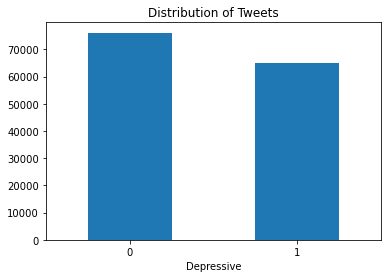

In [38]:
# Plotting the distribution for dataset.
ax = train_data.groupby("Depressive").count().plot(kind="bar", title="Distribution of Tweets", 
                                               legend=False)
ax.set_xticklabels(["0", "1"], rotation=0)

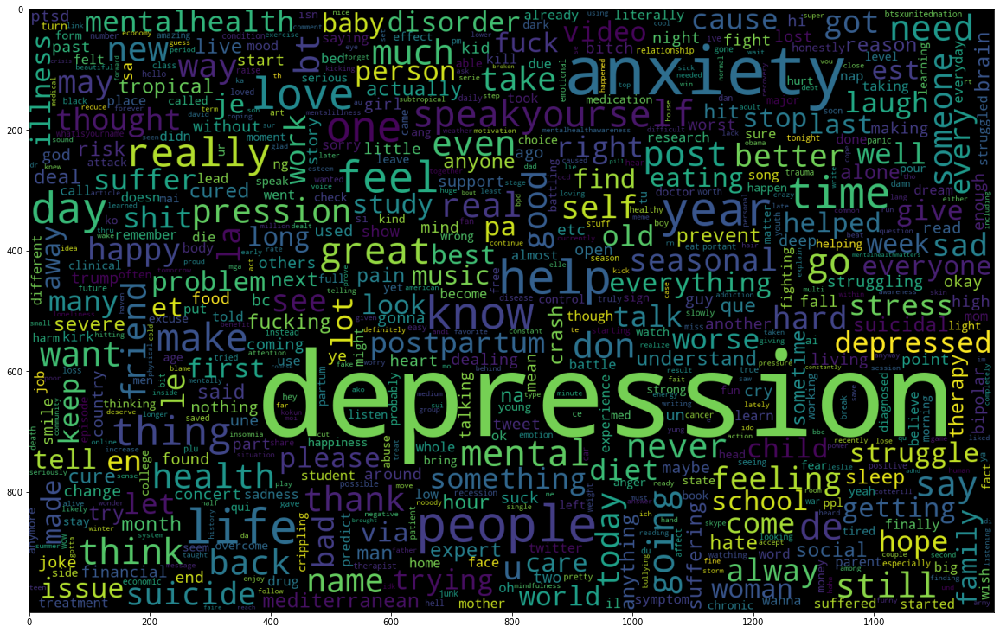

In [49]:
data_neg = train_data["Tweet"].iloc[:65058]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 700 , width = 1600 , height = 1000,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)

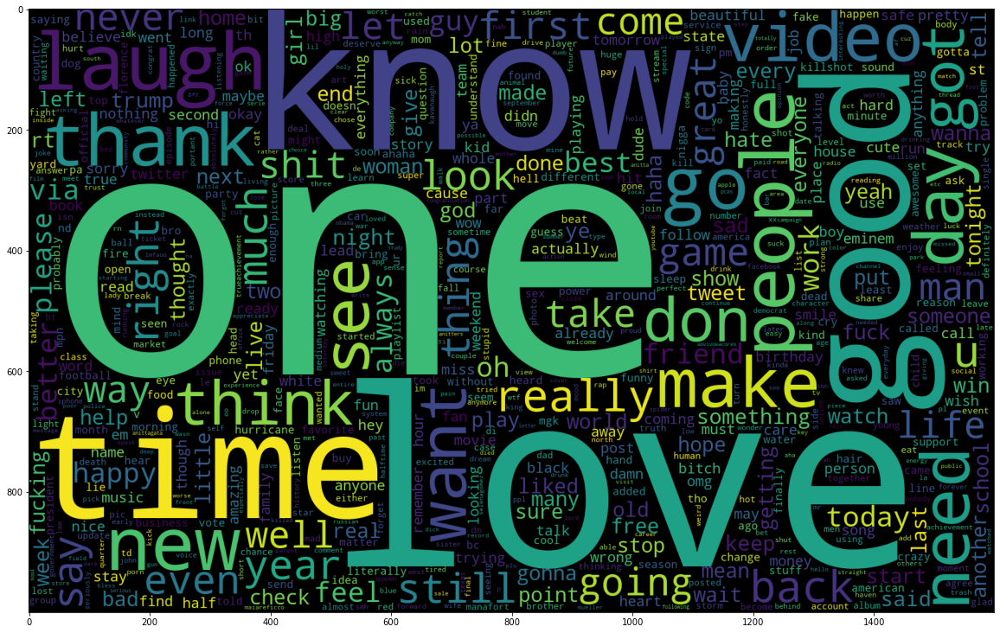

In [50]:
data_pos = train_data["Tweet"].iloc[65058:]
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 700 , width = 1600 , height = 1000,
               collocations=False).generate(" ".join(data_pos))
plt.imshow(wc)

In [52]:
train_data.to_csv("../data/final_dataset/Preprocessed_Tweets.csv")

In [53]:
train_data.to_pickle("Preprocessed_Tweets.pkl")